In [33]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg19 
from tensorflow.keras.applications import vgg16
import matplotlib.pyplot as plt


In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Loading Pictures and Preprocessing

In here we load both style and content pictures in order to start preprocessing and setting the size of the target image

In [ ]:
def GetDimensions(image_path):
  max_dim = 512
  img = tf.io.read_file(image_path)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)
  return np.array(new_shape)

In [ ]:
def preprocess_image(image_path  , model):
    img = keras.preprocessing.image.load_img(image_path, target_size=(Img_Rows, Img_Cols))
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = model.preprocess_input(img)
    return tf.convert_to_tensor(img)

def deprocess_image(x): 
    x = x.reshape((Img_Rows , Img_Cols ,3))
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x    

# Loss Functions 
We will be defining 3 Loss functions to be used in the Neural transfer algorithm which are: 
   - Style Loss: Loss functions that keeps the generated image close to the local textures of the   style image 
   - Content Loss: Keeps the high-level representation to the image close to the Base imgage
   - total variation loss: a regularization loss function that helps in decreasing the noise in the generated image
   
The style loss function uses either Gram Matrix or Mean Gram Matrix, which are used in capturing the Style 

In [ ]:
def Gram_Matrix(x):
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    Gram_Matrix = tf.matmul(features, tf.transpose(features))
    return Gram_Matrix

def Mean_Gram_Matrix(x):
    x -=tf.math.reduce_mean(x)
    x = tf.transpose(x, (2, 0, 1))
    features = tf.reshape(x, (tf.shape(x)[0], -1))
    Gram_Matrix = tf.matmul(features, tf.transpose(features))
    return Gram_Matrix    

def style_loss(style, combination, Mean):
    if Mean:
      S = Mean_Gram_Matrix(style)
      C = Mean_Gram_Matrix(combination)
    else: 
      S = Gram_Matrix(style)
      C = Gram_Matrix(combination)
    size = Img_Rows * Img_Cols
    return tf.reduce_sum(tf.square(S - C)) / (4.0 * (3 ** 2) * (size ** 2))

def content_loss(base, combination):
    return tf.reduce_sum(tf.square(combination - base))

In [ ]:
def compute_loss(combination_image, base_image, style_reference_image , feature_extractor, Mean):

    input_tensor = tf.concat([base_image,style_reference_image,combination_image], axis=0)
    features = feature_extractor(input_tensor)

  # Initialize the loss
    loss = tf.zeros(shape=())

  # Add content loss
    layer_features = features[content_layer_name]
    base_image_features = layer_features[0, :, :, :]
    combination_features = layer_features[2, :, :, :]
    loss = loss + content_weight * content_loss(base_image_features,combination_features)
  # Add style loss
    for layer_name in style_layer_names:
        layer_features = features[layer_name]
        style_reference_features = layer_features[1, :, :, :]
        combination_features = layer_features[2, :, :, :]
        s1 = style_loss(style_reference_features, combination_features , Mean)
        loss += (style_weight / len(style_layer_names)) * s1
  # Add total variation loss
    loss += total_variation_weight * tf.image.total_variation(combination_image)
    return loss

In [ ]:
@tf.function
def compute_loss_and_grads(combination_image, base_image, style_reference_image , feature_extractor , Mean):
    with tf.GradientTape() as tape:
        loss = compute_loss(combination_image, base_image, style_reference_image, feature_extractor, Mean)
    grads = tape.gradient(loss, combination_image)
    return loss , grads

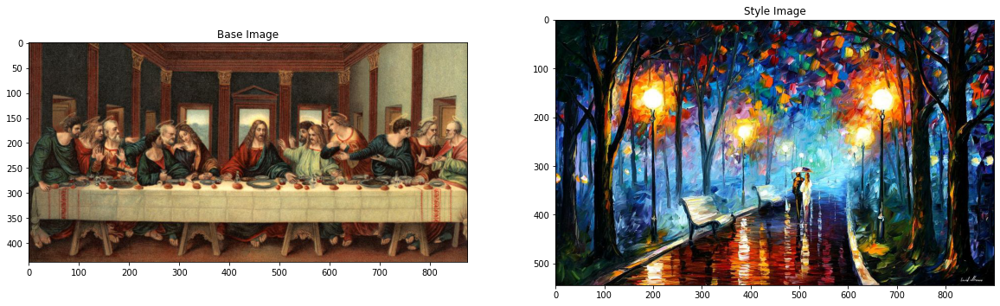

In [128]:
total_variation_weight = 1e-6
style_weight = 1e-6
content_weight = 2.5e-8 

base_image_path = "/content/drive/MyDrive/Project Pictures/The_Last_Supper.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style2.jpg"


Img_Rows , Img_Cols = GetDimensions(base_image_path)[0] , GetDimensions(base_image_path)[1] 


plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(1,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))
plt.show()

#VGG 16 Architecture
First of all, we will be using the VGG 16 Convolutional blocks for style and content feature extraction. 5 Convolutional layers will be used for style extraction while 1 layer will be used for content extraction. Both Gram Matrix and Mean Gram Matrix will be used 


In [129]:
model_2 = vgg16.VGG16(weights='imagenet', include_top=False)
model_2.trainable = False
style_layer_names = [
  'block1_conv1', 'block2_conv1',
  'block3_conv1', 'block4_conv1',
  'block5_conv1'
]
content_layer_name = 'block5_conv2'

In [130]:
optimizer_2 = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96))
outputs_dict = dict([(layer.name, layer.output) for layer in model_2.layers])
feature_extractor = keras.Model(inputs=model_2.inputs,outputs=outputs_dict)

base_image = preprocess_image(base_image_path,vgg16)
style_reference_image = preprocess_image(style_reference_image_path,vgg16)
combination_image = tf.Variable(preprocess_image(base_image_path,vgg16))
Loss_Iteration1 = dict()
for i in range(1, 4001):
    loss, grads = compute_loss_and_grads(combination_image, base_image, style_reference_image ,feature_extractor, False)    
    optimizer_2.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print('Iteration %d: loss=%.2f' % (i, loss))
        Loss_Iteration1[i] = loss
VGG16_Gram_Variation = float(tf.image.total_variation(tf.convert_to_tensor(combination_image , dtype = 'float')))
Final_Image = deprocess_image(combination_image.numpy())
keras.preprocessing.image.save_img("Result_Image_VGG16_6.png", Final_Image)

Iteration 100: loss=2826.94
Iteration 200: loss=1683.24
Iteration 300: loss=1199.44
Iteration 400: loss=932.69
Iteration 500: loss=765.31
Iteration 600: loss=651.91
Iteration 700: loss=570.97
Iteration 800: loss=510.66
Iteration 900: loss=464.14
Iteration 1000: loss=427.32
Iteration 1100: loss=397.50
Iteration 1200: loss=372.93
Iteration 1300: loss=352.36
Iteration 1400: loss=334.88
Iteration 1500: loss=319.90
Iteration 1600: loss=306.93
Iteration 1700: loss=295.61
Iteration 1800: loss=285.66
Iteration 1900: loss=276.85
Iteration 2000: loss=268.99
Iteration 2100: loss=261.94
Iteration 2200: loss=255.60
Iteration 2300: loss=249.85
Iteration 2400: loss=244.64
Iteration 2500: loss=239.89
Iteration 2600: loss=235.55
Iteration 2700: loss=231.56
Iteration 2800: loss=227.89
Iteration 2900: loss=224.50
Iteration 3000: loss=221.37
Iteration 3100: loss=218.47
Iteration 3200: loss=215.77
Iteration 3300: loss=213.26
Iteration 3400: loss=210.93
Iteration 3500: loss=208.75
Iteration 3600: loss=206.7

In [131]:
optimizer_2_Mean = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96))
outputs_dict = dict([(layer.name, layer.output) for layer in model_2.layers])
feature_extractor = keras.Model(inputs=model_2.inputs,outputs=outputs_dict)

base_image = preprocess_image(base_image_path,vgg16)
style_reference_image = preprocess_image(style_reference_image_path,vgg16)
combination_image = tf.Variable(preprocess_image(base_image_path,vgg16))
Loss_Iteration2 = dict()
for i in range(1, 4001):
    loss, grads = compute_loss_and_grads(combination_image, base_image, style_reference_image ,feature_extractor, True)    
    optimizer_2_Mean.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print('Iteration %d: loss=%.2f' % (i, loss))
        Loss_Iteration2[i] = loss
VGG16_Mean_Gram_Variation = float(tf.image.total_variation(tf.convert_to_tensor(combination_image , dtype = 'float')))
Final_Image = deprocess_image(combination_image.numpy())
keras.preprocessing.image.save_img("Result_Image_VGG16_Mean_6.png", Final_Image)

Iteration 100: loss=2376.00
Iteration 200: loss=1435.07
Iteration 300: loss=1086.00
Iteration 400: loss=902.11
Iteration 500: loss=784.82
Iteration 600: loss=701.92
Iteration 700: loss=639.37
Iteration 800: loss=590.20
Iteration 900: loss=550.31
Iteration 1000: loss=517.22
Iteration 1100: loss=489.38
Iteration 1200: loss=465.61
Iteration 1300: loss=445.10
Iteration 1400: loss=427.21
Iteration 1500: loss=411.47
Iteration 1600: loss=397.51
Iteration 1700: loss=385.06
Iteration 1800: loss=373.92
Iteration 1900: loss=363.90
Iteration 2000: loss=354.83
Iteration 2100: loss=346.60
Iteration 2200: loss=339.10
Iteration 2300: loss=332.24
Iteration 2400: loss=325.94
Iteration 2500: loss=320.15
Iteration 2600: loss=314.81
Iteration 2700: loss=309.87
Iteration 2800: loss=305.30
Iteration 2900: loss=301.07
Iteration 3000: loss=297.12
Iteration 3100: loss=293.45
Iteration 3200: loss=290.02
Iteration 3300: loss=286.81
Iteration 3400: loss=283.81
Iteration 3500: loss=281.00
Iteration 3600: loss=278.3

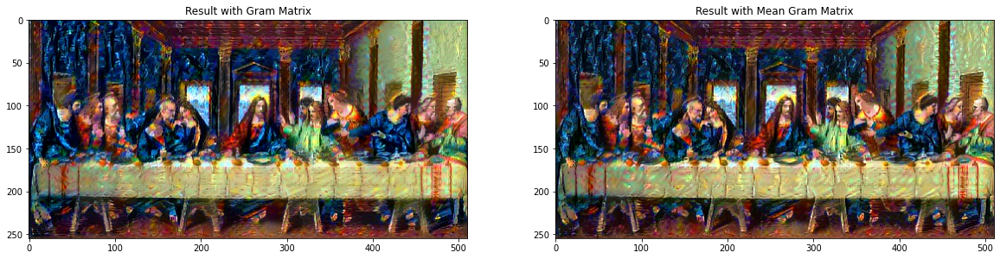

In [132]:
Final_Gram_VGG16 = keras.preprocessing.image.load_img("/content/Result_Image_VGG16_6.png")
Final_Mean_Gram_VGG16 = keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_6.png")
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Result with Gram Matrix")
plt.imshow(Final_Gram_VGG16)

plt.subplot(1,2,2)
plt.title("Result with Mean Gram Matrix")
plt.imshow(Final_Mean_Gram_VGG16)
plt.show()

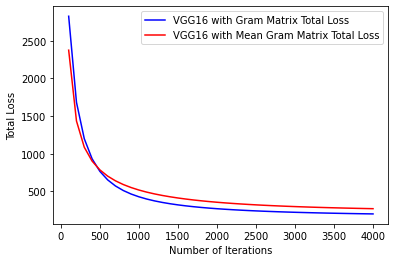

In [133]:
losses = list(Loss_Iteration1.values())
iter = list(Loss_Iteration1.keys())

losses_mean = list(Loss_Iteration2.values())
iter_mean = list(Loss_Iteration2.keys())


plt.plot(iter,losses,color = "blue" , label = "VGG16 with Gram Matrix Total Loss")
plt.plot(iter_mean,losses_mean,color = "red" , label = "VGG16 with Mean Gram Matrix Total Loss")
plt.xlabel("Number of Iterations")
plt.ylabel("Total Loss")
plt.legend()
plt.show()

# VGG 19 Model
Secondlly, we are using the vgg-19 architecture in order to apply the neural style transfer algorithm. We will be using 5 layers for style extraction and 1 Layer for content extraction. We will be using the same layer numbers that were used while using the vgg 16 Architecture to ensure fairness in comparison 



In [134]:
model = vgg19.VGG19(weights='imagenet', include_top=False)
model.trainable = False
style_layer_names = [
  'block1_conv1', 'block2_conv1',
  'block3_conv1', 'block4_conv1',
  'block5_conv1'
]
content_layer_name = 'block5_conv2'

In [135]:
optimizer = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96))
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
feature_extractor = keras.Model(inputs=model.inputs,outputs=outputs_dict)


base_image = preprocess_image(base_image_path, vgg19)
style_reference_image = preprocess_image(style_reference_image_path, vgg19)
combination_image = tf.Variable(preprocess_image(base_image_path, vgg19))
Loss_Iteration3 = dict()
for i in range(1, 4001):
    loss, grads = compute_loss_and_grads(combination_image, base_image, style_reference_image ,feature_extractor, False)    
    optimizer.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print('Iteration %d: loss=%.2f' % (i, loss))
        Loss_Iteration3[i] = loss
VGG19_Gram_Variation = float(tf.image.total_variation(tf.convert_to_tensor(combination_image , dtype = 'float')))
Final_Image = deprocess_image(combination_image.numpy())
keras.preprocessing.image.save_img("Result_Image_VGG19_6.png", Final_Image)

Iteration 100: loss=2629.37
Iteration 200: loss=1576.00
Iteration 300: loss=1203.25
Iteration 400: loss=1007.10
Iteration 500: loss=888.24
Iteration 600: loss=788.65
Iteration 700: loss=718.70
Iteration 800: loss=666.19
Iteration 900: loss=620.12
Iteration 1000: loss=582.09
Iteration 1100: loss=550.08
Iteration 1200: loss=522.95
Iteration 1300: loss=499.57
Iteration 1400: loss=479.29
Iteration 1500: loss=461.55
Iteration 1600: loss=445.90
Iteration 1700: loss=432.11
Iteration 1800: loss=419.83
Iteration 1900: loss=408.81
Iteration 2000: loss=398.87
Iteration 2100: loss=389.89
Iteration 2200: loss=381.72
Iteration 2300: loss=374.26
Iteration 2400: loss=367.42
Iteration 2500: loss=361.14
Iteration 2600: loss=355.37
Iteration 2700: loss=350.06
Iteration 2800: loss=345.13
Iteration 2900: loss=340.57
Iteration 3000: loss=336.33
Iteration 3100: loss=332.40
Iteration 3200: loss=328.74
Iteration 3300: loss=325.32
Iteration 3400: loss=322.13
Iteration 3500: loss=319.14
Iteration 3600: loss=316.

In [137]:
optimizer_mean = keras.optimizers.SGD(
    keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=100.0, decay_steps=100, decay_rate=0.96))
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
feature_extractor = keras.Model(inputs=model.inputs,outputs=outputs_dict)


base_image = preprocess_image(base_image_path, vgg19)
style_reference_image = preprocess_image(style_reference_image_path, vgg19)
combination_image = tf.Variable(preprocess_image(base_image_path, vgg19))
Loss_Iteration4 = dict()
for i in range(1, 4001):
    loss, grads = compute_loss_and_grads(combination_image, base_image, style_reference_image ,feature_extractor, True)    
    optimizer_mean.apply_gradients([(grads, combination_image)])
    if i % 100 == 0:
        print('Iteration %d: loss=%.2f' % (i, loss))
        Loss_Iteration4[i] = loss
VGG19_Mean_Gram_Variation = float(tf.image.total_variation(tf.convert_to_tensor(combination_image , dtype = 'float')))
Final_Image = deprocess_image(combination_image.numpy())
keras.preprocessing.image.save_img("Result_Image_VGG19_Mean_6.png", Final_Image)

Iteration 100: loss=1661.27
Iteration 200: loss=1108.09
Iteration 300: loss=884.86
Iteration 400: loss=759.28
Iteration 500: loss=677.90
Iteration 600: loss=620.41
Iteration 700: loss=576.98
Iteration 800: loss=542.66
Iteration 900: loss=514.98
Iteration 1000: loss=491.99
Iteration 1100: loss=472.62
Iteration 1200: loss=456.05
Iteration 1300: loss=441.70
Iteration 1400: loss=429.21
Iteration 1500: loss=418.19
Iteration 1600: loss=408.39
Iteration 1700: loss=399.62
Iteration 1800: loss=391.69
Iteration 1900: loss=384.51
Iteration 2000: loss=377.98
Iteration 2100: loss=372.01
Iteration 2200: loss=366.53
Iteration 2300: loss=361.49
Iteration 2400: loss=356.83
Iteration 2500: loss=352.53
Iteration 2600: loss=348.53
Iteration 2700: loss=344.82
Iteration 2800: loss=341.38
Iteration 2900: loss=338.16
Iteration 3000: loss=335.16
Iteration 3100: loss=332.36
Iteration 3200: loss=329.74
Iteration 3300: loss=327.28
Iteration 3400: loss=324.96
Iteration 3500: loss=322.79
Iteration 3600: loss=320.74

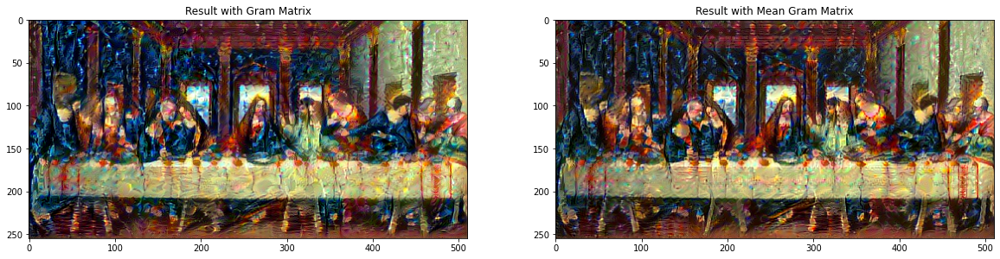

In [139]:
Final_Gram = keras.preprocessing.image.load_img("/content/Result_Image_VGG19_6.png")
Final_Mean_Gram = keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_6.png")
plt.figure(figsize=(20,20))
plt.subplot(1,2,1)
plt.title("Result with Gram Matrix")
plt.imshow(Final_Gram)

plt.subplot(1,2,2)
plt.title("Result with Mean Gram Matrix")
plt.imshow(Final_Mean_Gram)
plt.show()

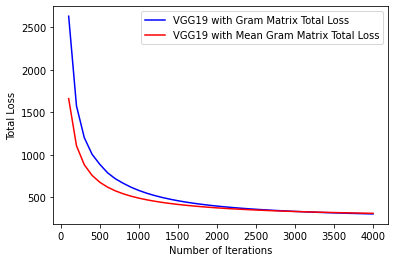

In [140]:
losses = list(Loss_Iteration3.values())
iter = list(Loss_Iteration3.keys())

losses_mean = list(Loss_Iteration4.values())
iter_mean = list(Loss_Iteration4.keys())


plt.plot(iter,losses,color = "blue" , label = "VGG19 with Gram Matrix Total Loss")
plt.plot(iter_mean,losses_mean,color = "red" , label = "VGG19 with Mean Gram Matrix Total Loss")
plt.xlabel("Number of Iterations")
plt.ylabel("Total Loss")
plt.legend()
plt.show()

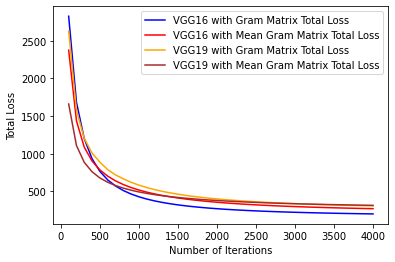

In [141]:
losses16 = list(Loss_Iteration1.values())
iter16 = list(Loss_Iteration1.keys())

losses_mean16 = list(Loss_Iteration2.values())
iter_mean16 = list(Loss_Iteration2.keys())

losses19 = list(Loss_Iteration3.values())
iter19 = list(Loss_Iteration3.keys())

losses_mean19 = list(Loss_Iteration4.values())
iter_mean19 = list(Loss_Iteration4.keys())


plt.plot(iter16,losses16,color = "blue" , label = "VGG16 with Gram Matrix Total Loss")
plt.plot(iter_mean16,losses_mean16,color = "red" , label = "VGG16 with Mean Gram Matrix Total Loss")

plt.plot(iter19,losses19,color = "orange" , label = "VGG19 with Gram Matrix Total Loss")
plt.plot(iter_mean19,losses_mean19,color = "brown" , label = "VGG19 with Mean Gram Matrix Total Loss")


plt.xlabel("Number of Iterations")
plt.ylabel("Total Loss")
plt.legend()
plt.show()

# Runs Results


# Run 1

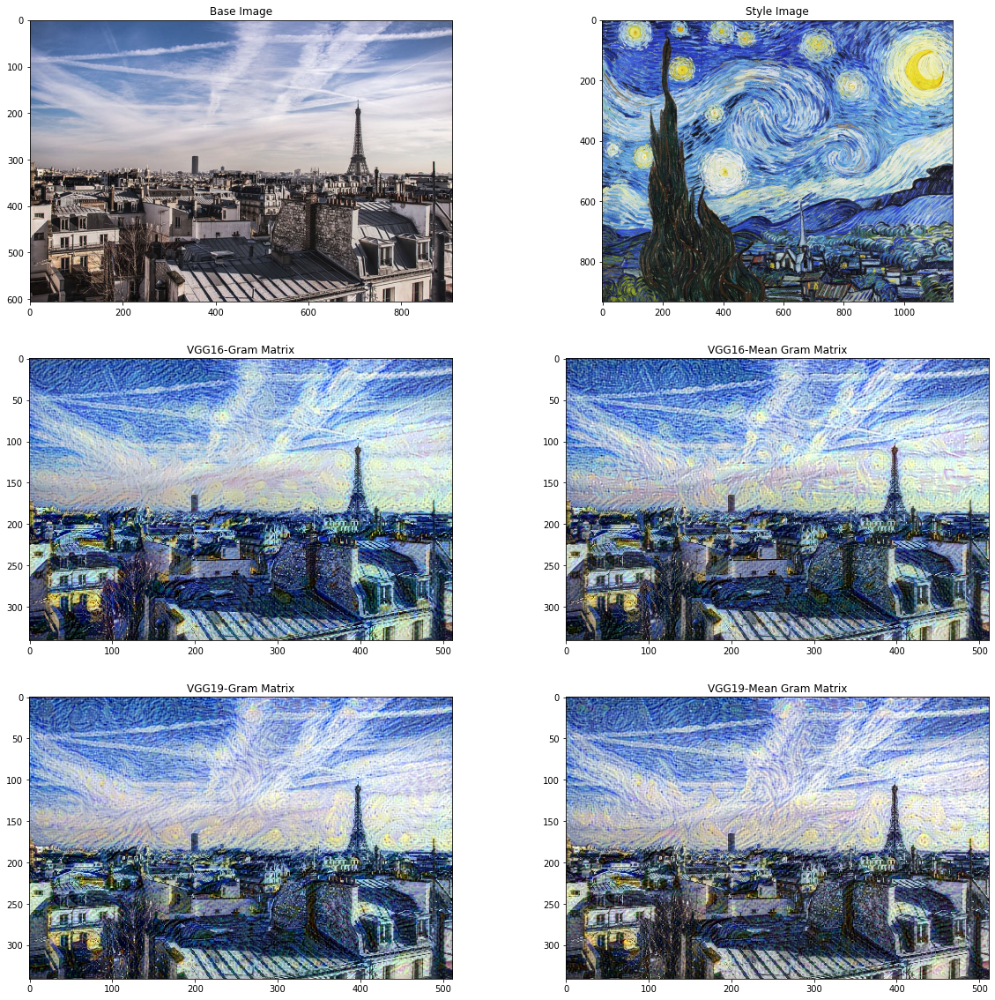

In [92]:
base_image_path = "/content/drive/MyDrive/Project Pictures/Paris.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style.jpg"
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(3,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))

plt.subplot(3,2,3)
plt.title("VGG16-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_1.png"))

plt.subplot(3,2,4)
plt.title("VGG16-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_1.png"))


plt.subplot(3,2,5)
plt.title("VGG19-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_1.png"))

plt.subplot(3,2,6)
plt.title("VGG19-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_1.png"))


plt.show()

# Run 2

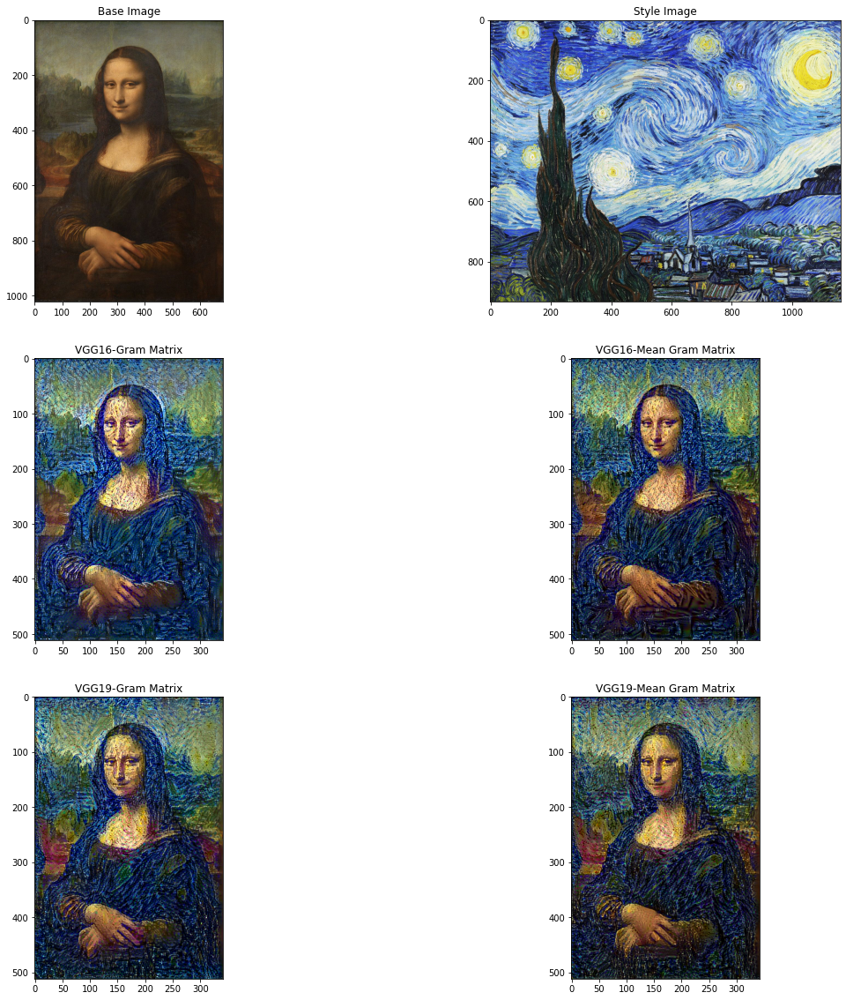

In [93]:
base_image_path = "/content/drive/MyDrive/Project Pictures/Monaliza.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style.jpg"
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(3,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))

plt.subplot(3,2,3)
plt.title("VGG16-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_2.png"))

plt.subplot(3,2,4)
plt.title("VGG16-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_2.png"))


plt.subplot(3,2,5)
plt.title("VGG19-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_2.png"))

plt.subplot(3,2,6)
plt.title("VGG19-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_2.png"))


plt.show()

# Run 3

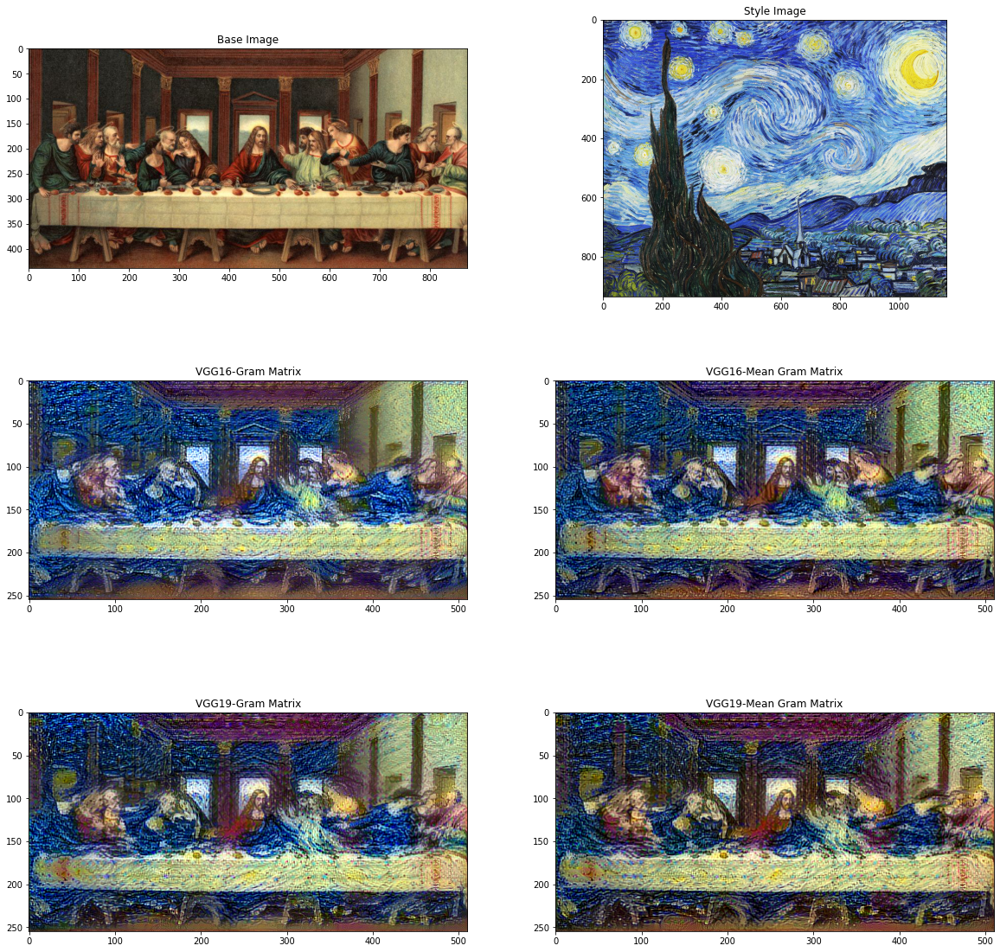

In [94]:
base_image_path = "/content/drive/MyDrive/Project Pictures/The_Last_Supper.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style.jpg"
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(3,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))

plt.subplot(3,2,3)
plt.title("VGG16-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_3.png"))

plt.subplot(3,2,4)
plt.title("VGG16-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_3.png"))


plt.subplot(3,2,5)
plt.title("VGG19-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_3.png"))

plt.subplot(3,2,6)
plt.title("VGG19-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_3.png"))


plt.show()

# Run 4

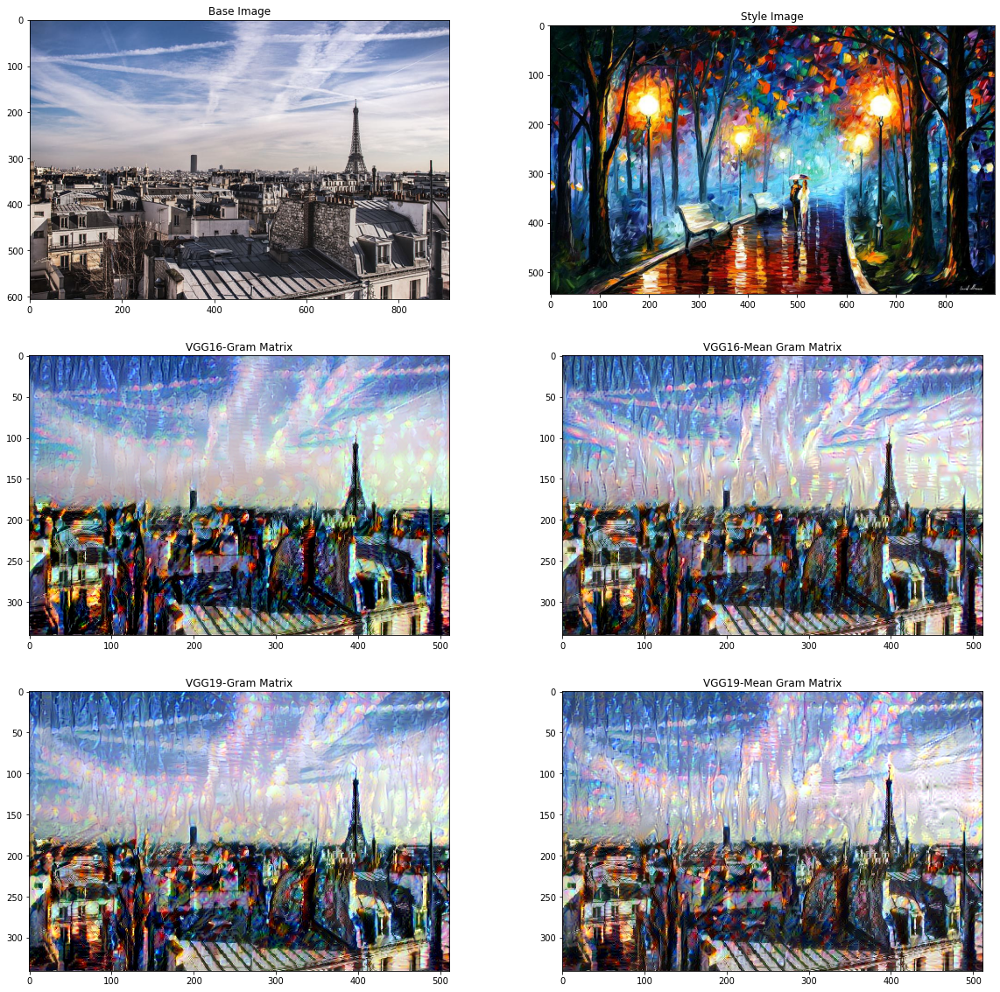

In [112]:
base_image_path = "/content/drive/MyDrive/Project Pictures/Paris.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style2.jpg"
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(3,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))

plt.subplot(3,2,3)
plt.title("VGG16-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_4.png"))

plt.subplot(3,2,4)
plt.title("VGG16-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_4.png"))


plt.subplot(3,2,5)
plt.title("VGG19-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_4.png"))

plt.subplot(3,2,6)
plt.title("VGG19-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_4.png"))


plt.show()

# Run 5

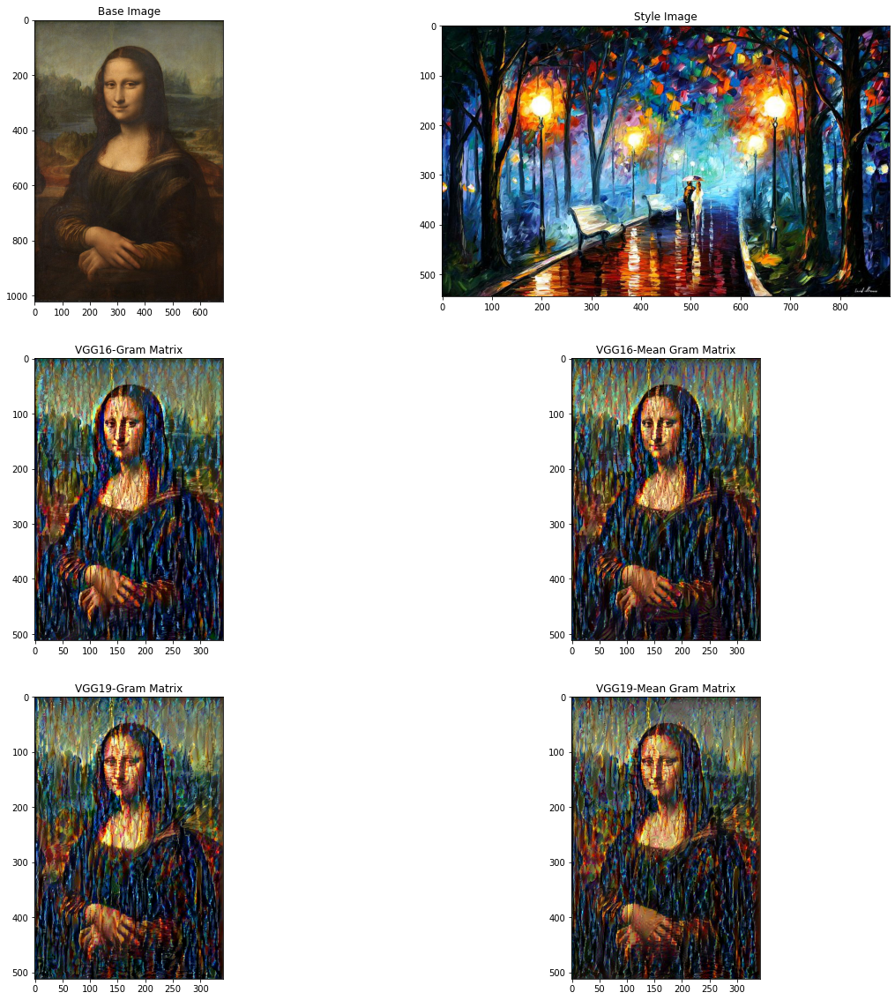

In [127]:
base_image_path = "/content/drive/MyDrive/Project Pictures/Monaliza.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style2.jpg"
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(3,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))

plt.subplot(3,2,3)
plt.title("VGG16-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_5.png"))

plt.subplot(3,2,4)
plt.title("VGG16-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_5.png"))


plt.subplot(3,2,5)
plt.title("VGG19-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_5.png"))

plt.subplot(3,2,6)
plt.title("VGG19-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_5.png"))


plt.show()

# Run 6

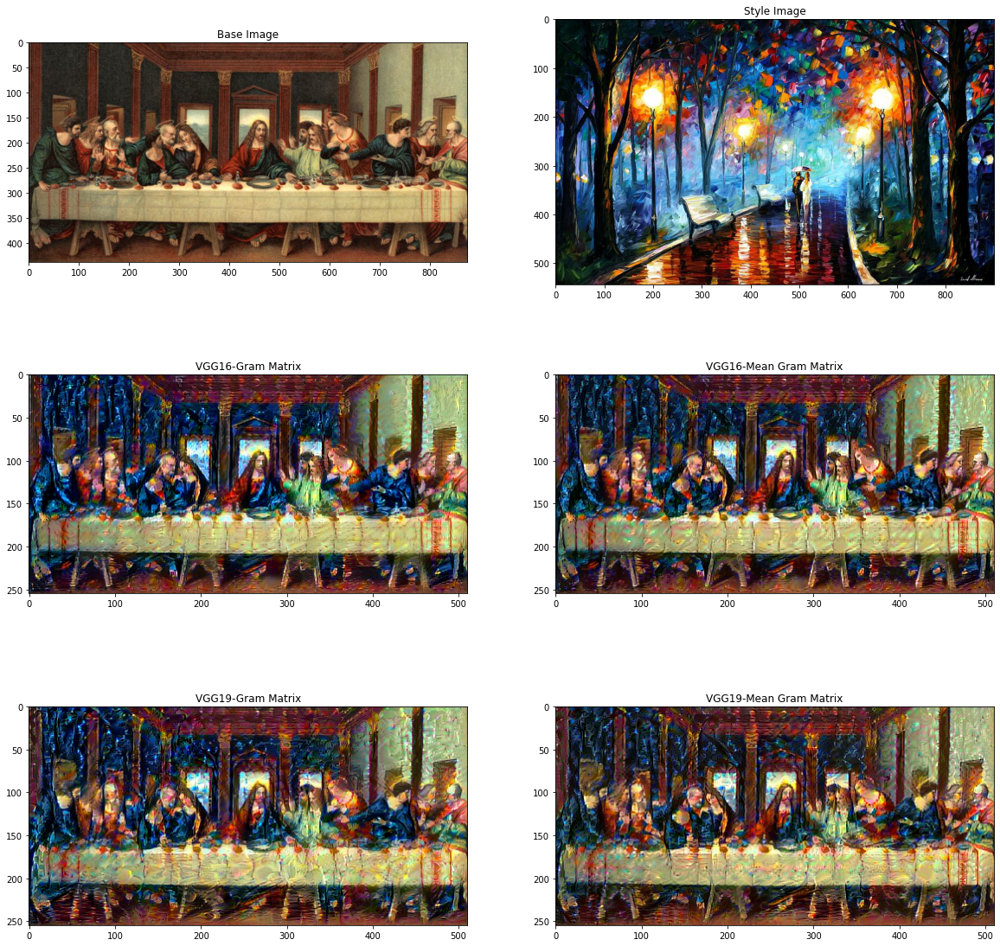

In [142]:
base_image_path = "/content/drive/MyDrive/Project Pictures/The_Last_Supper.jpg"
style_reference_image_path = "/content/drive/MyDrive/Project Pictures/Style2.jpg"
plt.figure(figsize=(20,20))

plt.subplot(3,2,1)
plt.title("Base Image")
plt.imshow(keras.preprocessing.image.load_img(base_image_path))

plt.subplot(3,2,2)
plt.title("Style Image")
plt.imshow(keras.preprocessing.image.load_img(style_reference_image_path))

plt.subplot(3,2,3)
plt.title("VGG16-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_6.png"))

plt.subplot(3,2,4)
plt.title("VGG16-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG16_Mean_6.png"))


plt.subplot(3,2,5)
plt.title("VGG19-Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_6.png"))

plt.subplot(3,2,6)
plt.title("VGG19-Mean Gram Matrix")
plt.imshow(keras.preprocessing.image.load_img("/content/Result_Image_VGG19_Mean_6.png"))


plt.show()